In [1]:
import torch
import torch.nn.functional as F

from PIL import Image
import numpy as np

import utils.functions as functions
import matplotlib.pyplot as plt

device = "cuda:0"
torch.set_default_tensor_type('torch.cuda.FloatTensor')

# Panorama Image To Multiple Perpective Image
- pers_dirs : 각 카메라에서 투영된 방향 벡터를 결합한 텐서. 각 방향은 3D 벡터로 표현되며, 구면의 특정 영역을 가리킨다.
- pers_ratios : 각 투영 카메라에서 픽셀 비율 값을 결합한 텐서. 비율은 카메라 화면의 가로:세로 비를 나타낸다.
- to_vecs: 각 카메라의 전방(앞쪽) 방향 벡터. 카메라가 바라보는 중심 방향을 나타낸다.
- down_vecs : 각 카메라의 아래쪽 방향 벡터. 카메라 프레임에서 아래쪽을 정의하는 데 사용된다.
- right_vecs : 각 카메라의 오른쪽 방향 벡터. 카메라 프레임에서 오른쪽을 정의하는 데 사용된다.

In [2]:
from utils.geo_utils import panorama_to_pers_directions

pano_width, pano_height = 2048, 1024

# Load and resize panoram image
image_path = "input/input_panorama.png"
image = Image.open(image_path)
image = functions.resize_image_with_aspect_ratio(image, new_width=pano_width)
panorama_tensor = torch.tensor(np.array(image), dtype=torch.float)[..., :3].permute(2, 0, 1).unsqueeze(0)

# Generate perspective directions
gen_res = 512
pers_dirs, pers_ratios, to_vecs, down_vecs, right_vecs = [], [], [], [], []
for ratio in [1.4]:
    cur_pers_dirs, cur_pers_ratios, cur_to_vecs, cur_down_vecs, cur_right_vecs = panorama_to_pers_directions(gen_res=gen_res, ratio=ratio)

    pers_dirs.append(cur_pers_dirs)
    pers_ratios.append(cur_pers_ratios)
    to_vecs.append(cur_to_vecs)
    down_vecs.append(cur_down_vecs)
    right_vecs.append(cur_right_vecs)

# Concatenate tensors
pers_dirs = torch.cat(pers_dirs, 0)  
pers_ratios = torch.cat(pers_ratios, 0)  
to_vecs = torch.cat(to_vecs, 0) 
down_vecs = torch.cat(down_vecs, 0) 
right_vecs = torch.cat(right_vecs, 0)

print("방향 백터 개수 : ",len(pers_dirs))

pers_dirs = pers_dirs.to(device)
pers_ratios = pers_ratios.to(device)
to_vecs = to_vecs.to(device)
down_vecs = down_vecs.to(device)
right_vecs = right_vecs.to(device)

방향 백터 개수 :  20


In [3]:
import plotly.graph_objects as go

# Constants
num_cameras = 3  # 카메라 개수
colors = plt.cm.rainbow(np.linspace(0, 1, num_cameras))  # 색상 매핑

# 구 표면 생성
u = np.linspace(0, 2 * np.pi, 100)
v = np.linspace(0, np.pi, 100)
sphere_x = np.outer(np.cos(u), np.sin(v))
sphere_y = np.outer(np.sin(u), np.sin(v))
sphere_z = np.outer(np.ones_like(u), np.cos(v))

# Plotly 3D scatter 데이터 생성
fig = go.Figure()

# 구 표면 추가
fig.add_trace(go.Surface(
    x=sphere_x,
    y=sphere_y,
    z=sphere_z,
    colorscale='Blues',
    opacity=0.5,
    showscale=False
))

sampling_rate = 16  # 샘플링 간격 (높을수록 빠름)

for camera_index in range(num_cameras):
    pers_dirs_sample = pers_dirs[camera_index, ::sampling_rate, ::sampling_rate, :]  # 데이터 샘플링
    pers_dirs_np = pers_dirs_sample.cpu().numpy()
    
    # 단위 벡터로 정규화
    magnitudes = np.linalg.norm(pers_dirs_np, axis=-1, keepdims=True)
    unit_vectors = pers_dirs_np / magnitudes
    
    # x, y, z 좌표 추출
    x, y, z = unit_vectors[..., 0].flatten(), unit_vectors[..., 1].flatten(), unit_vectors[..., 2].flatten()
    
    # RGB 값을 정수로 변환
    r = int(colors[camera_index][0] * 255)
    g = int(colors[camera_index][1] * 255)
    b = int(colors[camera_index][2] * 255)
    
    # Plotly의 scatter3d로 추가
    fig.add_trace(go.Scatter3d(
        x=x,
        y=y,
        z=z,
        mode='markers',
        marker=dict(size=2, color=f'rgb({r}, {g}, {b})'),
        name=f'Camera {camera_index}'
    ))

# 레이아웃 설정
fig.update_layout(
    title='3D Camera Directions on Sphere',
    scene=dict(
        xaxis=dict(title='X'),
        yaxis=dict(title='Y'),
        zaxis=dict(title='Z')
    )
)

# 인터랙티브 플롯 표시
fig.show()

In [8]:
from utils.camera_utils import *

# Input : 구면 좌표계 상의 dirs 3d 방향백터
# Output : dirs 3d 방향백터에 대응하는 위도(beta)와 경도(alpha)를 결합한 tensor
def direction_to_pano_coord(dirs):
    dirs = dirs / torch.linalg.norm(dirs, 2, -1, True)
    beta = torch.arcsin(dirs[..., 2])
    xy = dirs[..., :2] / torch.cos(beta)[..., None]
    alpha = torch.view_as_complex(xy).angle()   # [-np.pi., np.pi]
    return torch.stack([beta, alpha], -1)

# Input : dirs 3d 방향백터에 대흥하는 위도(beta)와 경도(alpha)를 결합한 텐서
# Output : 구면좌표계를 평면좌표계로 변환한 tensor
def pano_to_img_coord(coords):
    y, x = coords[..., 0], coords[..., 1]
    return torch.stack([-y / np.pi + .5, -(x / (2. * np.pi)) + .5], -1)

def direction_to_img_coord(dirs):
    return pano_to_img_coord(direction_to_pano_coord(dirs))

In [14]:
img = panorama_tensor.squeeze()
n_pers = len(pers_dirs)

# 구면 좌표계 -> 이미지 좌표계
# img_coords: [n, 2] shape of tensor
img_coords = direction_to_img_coord(pers_dirs)
# normalize scale to [-1, 1]
sample_coords = img_coord_to_sample_coord(img_coords)

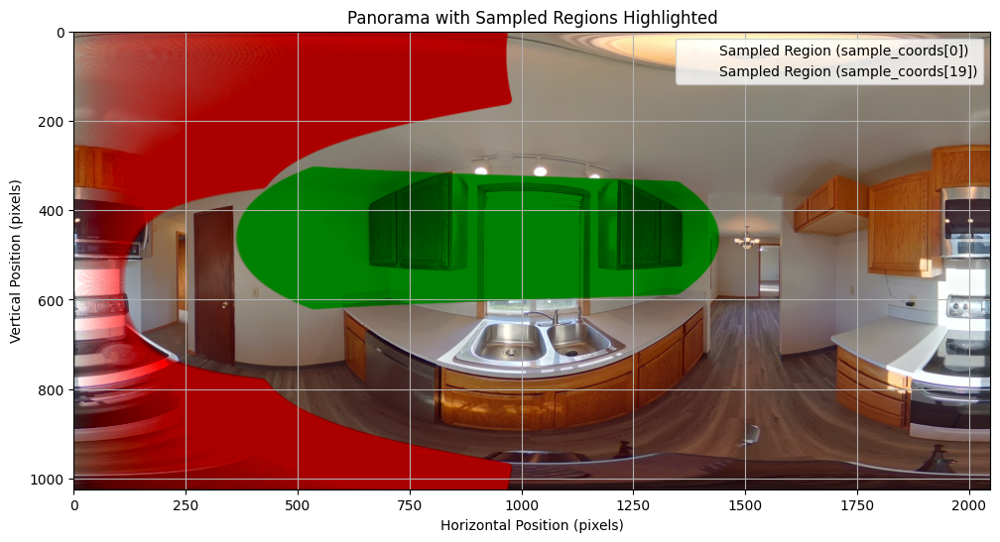

In [44]:
aspect_ratio = pano_width / pano_height  # 비율 계산

# 샘플링된 좌표 정규화 함수 정의
def normalize_sample_coords_for_panorama(sample_coords, index, pano_width, pano_height):
    """
    샘플링된 좌표를 [-1, 1] -> [0, pano_width 또는 pano_height]로 변환
    :param sample_coords: PyTorch 텐서 형태의 좌표
    :param index: 특정 샘플의 인덱스
    :param pano_width: 파노라마의 너비
    :param pano_height: 파노라마의 높이
    :return: NumPy 배열로 변환된 정규화된 좌표
    """
    coords = (sample_coords[index] + 1) / 2.0  # [-1, 1] -> [0, 1] 변환
    coords[..., 0] *= pano_height  # y좌표 -> 파노라마 높이 반영
    coords[..., 1] *= pano_width   # x좌표 -> 파노라마 너비 반영
    
    return coords.view(-1, 2).cpu().numpy()  # [n, 2] 형태로 변환

# 샘플링된 좌표 정규화 및 변환 (파노라마 이미지 크기 기준)
highlight_coords_1 = normalize_sample_coords_for_panorama(sample_coords, 0, pano_width, pano_height)
highlight_coords_2 = normalize_sample_coords_for_panorama(sample_coords, 19, pano_width, pano_height)

# 파노라마 이미지를 NumPy 배열로 변환 및 정규화
panorama_image = panorama_tensor.squeeze().permute(1, 2, 0).cpu().numpy()  # [C, H, W] -> [H, W, C]
panorama_image = (panorama_image - panorama_image.min()) / (panorama_image.max() - panorama_image.min())  # Normalize to [0, 1]

# 시각화
plt.figure(figsize=(12, 6))
plt.imshow(panorama_image, extent=[0, pano_width, pano_height, 0])  # extent를 이미지 크기에 맞춤
plt.scatter(highlight_coords_1[:, 1], highlight_coords_1[:, 0], s=20, color='red', alpha=0.01, label='Sampled Region (sample_coords[0])')
plt.scatter(highlight_coords_2[:, 1], highlight_coords_2[:, 0], s=20, color='green', alpha=0.01, label='Sampled Region (sample_coords[19])')

# 플롯 설정
plt.title('Panorama with Sampled Regions Highlighted')
plt.xlabel('Horizontal Position (pixels)')
plt.ylabel('Vertical Position (pixels)')
plt.legend()
plt.grid()
plt.show()

/opt/conda/lib/python3.10/site-packages/torch/nn/functional.py:4236: UserWarning:

Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.



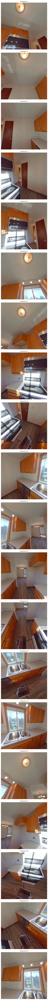

In [10]:
pers_imgs = F.grid_sample(img[None].expand(n_pers, -1, -1, -1), sample_coords, padding_mode='border')

# 시각화할 행(row)과 열(column) 개수 설정
rows, cols = 20, 1

# 시각화 준비
fig, axes = plt.subplots(rows, cols, figsize=(5, 100))  # 세로로 길게 배치

for i in range(rows):
    # 각 이미지를 특정 채널의 평균으로 계산 (또는 원하는 채널 선택 가능)
    img = pers_imgs[i].mean(dim=0).cpu().numpy()  # 평균으로 계산하여 2D 이미지 생성
    # 각 이미지를 [C, H, W] -> [H, W, C]로 변환
    img = pers_imgs[i].permute(1, 2, 0).cpu().numpy()
    # 이미지를 [0, 1] 범위로 정규화
    img = (img - img.min()) / (img.max() - img.min())
    # 각 행에 이미지 시각화
    axes[i].imshow(img)
    axes[i].axis('off')  # 축 제거
    axes[i].set_title(f'Perspective {i+1}', fontsize=8)

plt.tight_layout()
plt.show()

In [26]:
from modules.geo_predictors.omnidata.omnidata_predictor import OmnidataPredictor
from modules.geo_predictors.omnidata.omnidata_normal_predictor import OmnidataNormalPredictor

depth_predictor = OmnidataPredictor()
normal_predictor = OmnidataNormalPredictor()

# Intrinsic Parameters
fx = torch.linalg.norm(to_vecs, 2, -1, True) / torch.linalg.norm(right_vecs, 2, -1, True) * gen_res * .5
fy = torch.linalg.norm(to_vecs, 2, -1, True) / torch.linalg.norm(down_vecs, 2, -1, True) * gen_res * .5
cx = torch.ones_like(fx) * gen_res * .5
cy = torch.ones_like(fy) * gen_res * .5

rot_w2c = torch.stack([right_vecs / torch.linalg.norm(right_vecs, 2, -1, True),
                               down_vecs / torch.linalg.norm(down_vecs, 2, -1, True),
                               to_vecs / torch.linalg.norm(to_vecs, 2, -1, True)],
                              dim=1)
rot_c2w = torch.linalg.inv(rot_w2c)

pred_distances_raw = []
pred_normals_raw = []

ref_distance = torch.ones([pano_height, pano_width, 1]).squeeze()[..., None].float().permute(2, 0, 1)
mask = torch.ones([pano_height, pano_width]).squeeze()[..., None].float().permute(2, 0, 1) 
ref_distance_mask = torch.cat([ref_distance, mask], 0)

pers_distances = F.grid_sample(ref_distance[None].expand(n_pers, -1, -1, -1), sample_coords, padding_mode='border') 
pers_masks = F.grid_sample(mask[None].expand(n_pers, -1, -1, -1), sample_coords, padding_mode='border') 

for i in range(n_pers):
    with torch.no_grad():
        intri = {
            'fx': fx[i].item(),
            'fy': fy[i].item(),
            'cx': cx[i].item(),
            'cy': cy[i].item()
        }
        pred_depth = depth_predictor.predict_depth(pers_imgs[i: i+1], intri=intri, pers_distance=pers_distances[i: i+1], pers_mask=pers_masks[i: i+1]).cuda().clip(0., None)  # [1, 1, res, res]
        pred_depth = pred_depth / (pred_depth.mean() + 1e-5)
        pred_distances_raw.append(pred_depth * pers_ratios[i].permute(2, 0, 1)[None])

        pred_normals = normal_predictor.predict_normal(pers_imgs[i: i+1])
        pred_normals = pred_normals * 2. - 1.
        pred_normals = pred_normals / torch.linalg.norm(pred_normals, ord=2, dim=1, keepdim=True)

        pred_normals = pred_normals.permute(0, 2, 3, 1) 
        pred_normals = apply_rot(pred_normals, rot_c2w[i])
        pred_normals = pred_normals.permute(0, 3, 1, 2)  
        pred_normals_raw.append(pred_normals)

pred_distances_raw = torch.cat(pred_distances_raw, dim=0)  
pred_normals_raw = torch.cat(pred_normals_raw, dim=0)     
pers_dirs = pers_dirs.permute(0, 3, 1, 2)        

/opt/conda/lib/python3.10/site-packages/torch/nn/functional.py:4236: UserWarning:

Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.

/opt/conda/lib/python3.10/site-packages/torchvision/transforms/functional.py:1603: UserWarning:

The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).



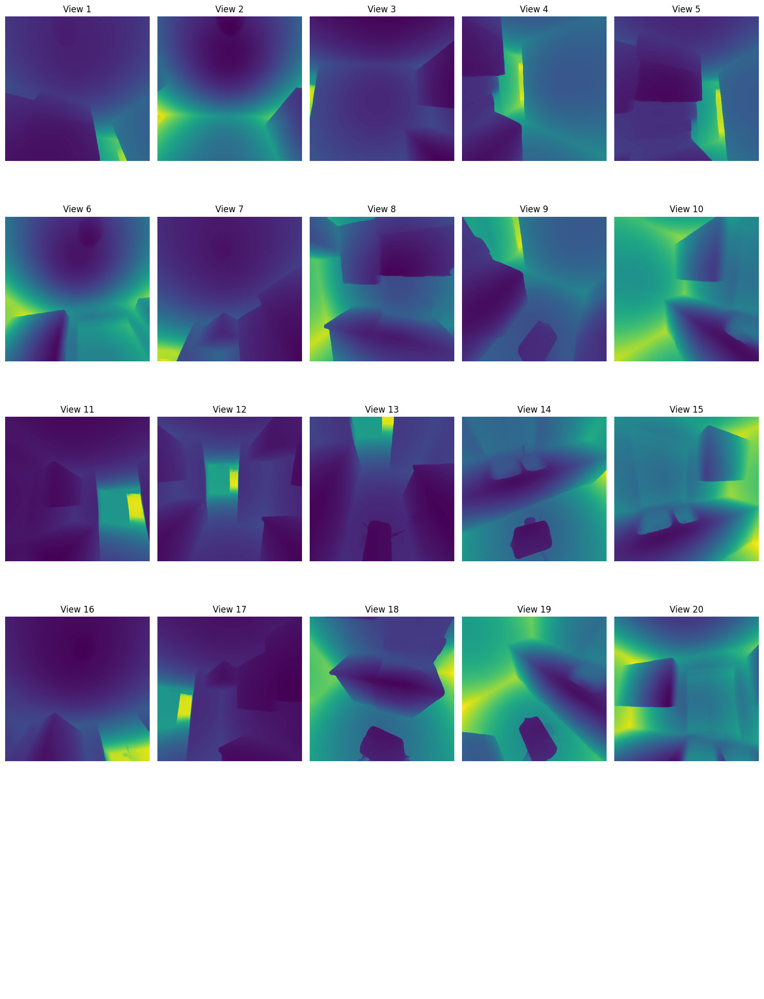

In [27]:
# pred_distances_raw를 NumPy 배열로 변환
pred_distances_np = pred_distances_raw.squeeze().cpu().numpy()  # [n_pers, res, res]

# 시각화
n_pers = pred_distances_np.shape[0]  # 원근 투영된 이미지 개수
fig, axes = plt.subplots(n_pers // 5 + 1, 5, figsize=(15, n_pers))  # 5개씩 한 행에 배치
axes = axes.flatten()

for i in range(n_pers):
    ax = axes[i]
    ax.imshow(pred_distances_np[i], cmap='viridis')  # 거리 데이터를 컬러 맵으로 표시
    ax.axis('off')
    ax.set_title(f"View {i+1}")

# 남은 플롯 비우기
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


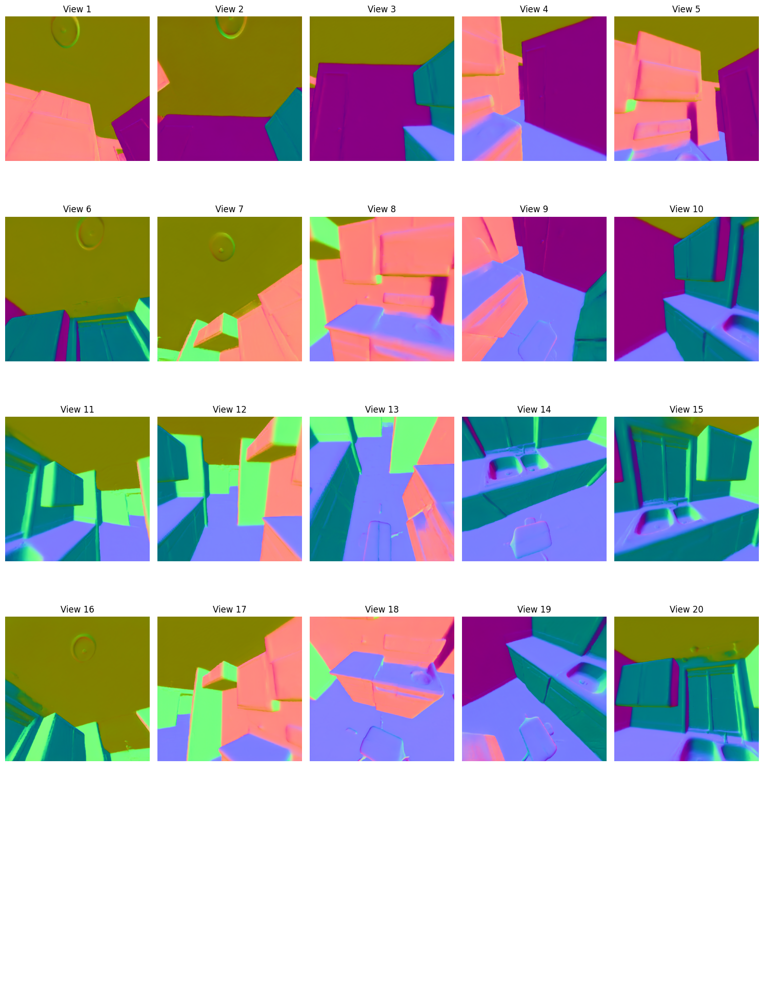

In [34]:
# pred_normals_raw를 NumPy 배열로 변환
pred_normals_raw_np = pred_normals_raw.permute(0, 2, 3, 1).cpu().numpy()  # [n_pers, res, res, 3]

# 시각화
n_pers = pred_normals_raw.shape[0]  # 원근 투영된 이미지 개수
fig, axes = plt.subplots(n_pers // 5 + 1, 5, figsize=(15, n_pers))  # 5개씩 한 행에 배치
axes = axes.flatten()

for i in range(n_pers):
    ax = axes[i]
    # 법선 벡터는 RGB로 표현 ([-1, 1] 범위를 [0, 1]로 변환)
    normal_image = (pred_normals_raw_np[i] + 1) / 2.0  # Normalize to [0, 1]
    ax.imshow(normal_image)  # RGB 이미지를 표시
    ax.axis('off')
    ax.set_title(f"View {i+1}")

# 남은 플롯 비우기
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()